# Merfish data playground

In [311]:
import os
import numpy as np
import scipy.interpolate
import seaborn
import matplotlib.pyplot as plt

In [6]:
os.getcwd()

'/home/luke/transcriptomics/spatial-analysis-wg/code/segmentation'

In [471]:
def load_and_cache(csv_file):
    """Load data from merfish detected transcripts csv file.
    
    Since this is a slow process, also save out a cache .npz file to speed up subsequent accesses.
    """
    np_file = os.path.splitext(csv_file)[0] + '.npz'
    if not os.path.exists(np_file):
        print("Loading csv..")
        dtype = [('x', 'float32'), ('y', 'float32'), ('z', 'float32'), ('gene', 'int')]
        data = np.loadtxt(csv_file, skiprows=1, usecols=[2,3,4,9], delimiter=',', dtype=dtype)
        print("Recompressing to npz..")
        np.savez_compressed(np_file, data)
    else:
        print("Loading from npz..")
        data = np.load(np_file)['arr_0']
    return data

## Load merfish data, plot a subset of detected transcripts

In [470]:
data_file = '../../../data/merfish_test/202202210831_60988210_VMSC01601/detected_transcripts.csv'
data = load_and_cache(data_file)

Loading from npz..


<AxesSubplot:>

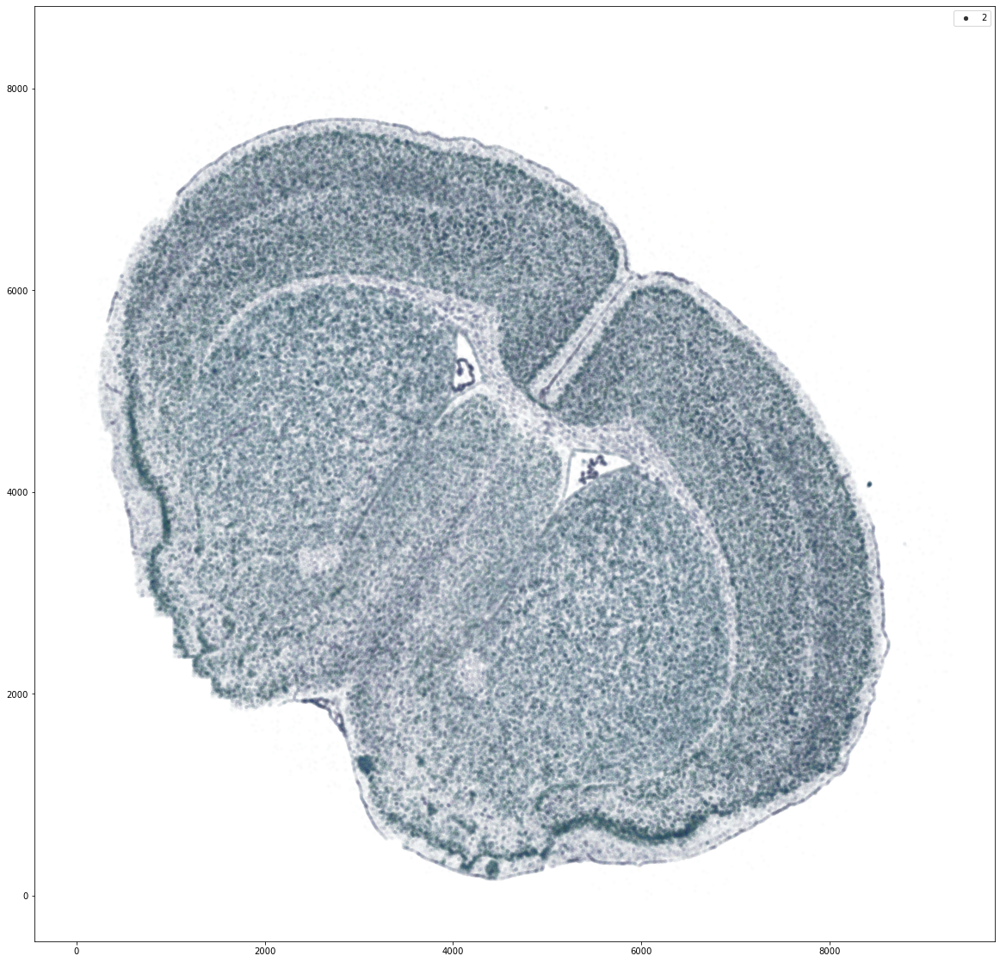

In [472]:
data2 = data[::100]

fig,ax = plt.subplots(figsize=(20, 20))
seaborn.scatterplot(x=data2['x'], y=data2['y'], c=data2['gene'], alpha=0.01, linewidth=0, size=2, ax=ax)

## Select a subregion to plot

In [466]:
xlim = (5600, 6000)
ylim = (5800, 6200)

#xlim = (5650, 5700)
#ylim = (6100, 6150)

mask = (data['x'] > xlim[0]) & (data['x'] < xlim[1]) & (data['y'] > ylim[0]) & (data['y'] < ylim[1])
data2 = data[mask]
#data2 = data2[data2[:,2] == data2[:,2].min()]
data2.shape

(566278,)

<AxesSubplot:>

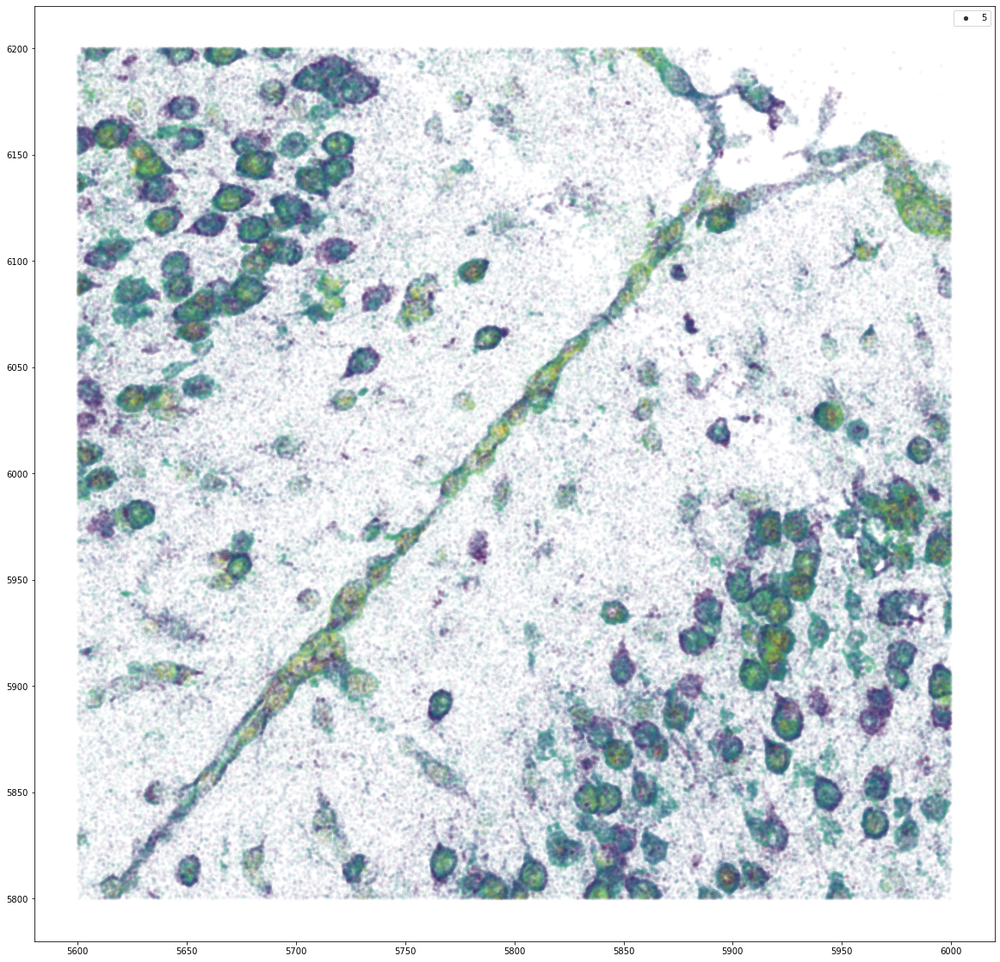

In [467]:
fig,ax = plt.subplots(figsize=(20, 20))
seaborn.scatterplot(x=data2['x'], y=data2['y'], c=data2['z'], alpha=0.05, linewidth=0, ax=ax, size=5)

## Generate maps colored by transcript expression levels

Approach:
- bin data into pixels
- sum up expression counts in each bin
- use umap to identify different types of expression patterns
- color each pixel based on position within umap

In [511]:
from tqdm.notebook import tqdm_notebook as tqdm

def binned_expression_counts(x, y, gene, binsize, spacing=None):
    spacing = spacing or binsize
    padding = (binsize - spacing) / 2
    
    xrange = x.min(), x.max()
    yrange = y.min(), y.max()
    gene_set = np.unique(gene)
    gene_inds = {gene_set[i]:i for i in range(len(gene_set))} 
    
    x_bins = int(np.ceil((xrange[1] - xrange[0]) / spacing))
    y_bins = int(np.ceil((yrange[1] - yrange[0]) / spacing))
    shape = (x_bins, y_bins, len(gene_set))
    
    counts = np.zeros(shape, dtype='uint32')
    for i in tqdm(range(x_bins)):
        xbin = (xrange[0] + i * spacing - padding), (xrange[0] + (i+1) * spacing + padding)
        xmask = (x > xbin[0]) & (x < xbin[1])
        y2 = y[xmask]
        g2 = gene[xmask]
        for j in range(y_bins):
            ybin = (yrange[0] + j * spacing - padding), (yrange[0] + (j+1) * spacing + padding)
            ymask = (y2 > ybin[0]) & (y2 < ybin[1])
            g3 = g2[ymask]
            for g, c in zip(*np.unique(g3, return_counts=True)):
                counts[i, j, gene_inds[g]] = c
                
    return counts, gene_set, gene_inds, (xrange[0], xrange[0] + binsize * x_bins), (yrange[0], yrange[0] + binsize * y_bins)
    

In [290]:
import umap
from sklearn.preprocessing import StandardScaler

def reduce_expression(data, umap_args):
    default_umap_args = {'n_neighbors': 3, 'min_dist': 0.4, 'n_components': 3}
    default_umap_args.update(umap_args)

    flat_data = data.reshape(data.shape[0] * data.shape[1], data.shape[2])
    
    # remove rows with no transcripts
    mask = flat_data.sum(axis=1) > 0
    masked_data = flat_data[mask]
    
    # scale in prep for umap
    scaler = StandardScaler()
    scaled = scaler.fit_transform(masked_data)
    
    # reduce down to 3D
    reducer = umap.UMAP(**default_umap_args)    
    reduced = reducer.fit_transform(scaled)
    
    # re-insert rows with no transcripts (all 0)
    final = np.zeros((len(flat_data), reduced.shape[1]), dtype=reduced.dtype)
    final[mask] = reduced
    
    # return reshaped to original image
    return final.reshape(data.shape[0], data.shape[1], final.shape[-1])
    


In [554]:
def map_to_ubyte(data):
    mn, mx = data.min(), data.max()
    return np.clip((data - mn) * 255 / (mx - mn), 0, 255).astype('ubyte')

def rainbow_wheel(points, center=None, radius=None, center_color=None):
    """Given an Nx2 array of point locations, return an Nx3 array of RGB
    colors derived from a rainbow color wheel centered over the mean point location.
    """
    flat = points.reshape(np.product(points.shape[:-1]), points.shape[-1])
    if center is None:
        center = flat.mean(axis=0)
    if radius is None:
        radius = 4 * flat.std(axis=0)
    f = np.linspace(0, 1, 10)[:-1]
    theta = f * 2 * np.pi
    x = np.vstack([radius[0] * np.cos(theta) + center[0], radius[1] * np.sin(theta) + center[1]]).T
    c = plt.cm.gist_rainbow(f)[:, :3]
    
    if center_color is not None:
        x = np.concatenate([x, center[None, :]], axis=0)
        c = np.concatenate([c, np.array(center_color)[None, :]], axis=0)
    
    color = scipy.interpolate.griddata(x, c, flat[:, :2], fill_value=0)
    return color.reshape(points.shape[:-1] + (3,))
    
def show_float_rgb(data, extent, ax):
    """Show a color image given a WxHx3 array of floats. 
    Each channel is normalized independently. 
    """
    rgb = np.empty(data.shape[:2] + (3,), dtype='ubyte')
    for i in (0, 1, 2):
        rgb[..., i] = map_to_ubyte(data[..., i])

    return ax.imshow(np.rot90(rgb), extent=extent, aspect='equal')

### 1. bin data into pixels, sum expression counts within each bin

In [512]:
print("Binning expression counts..")
bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=100)
bec.shape

Binning expression counts..


  0%|          | 0/93 [00:00<?, ?it/s]

(93, 85, 501)

### 2. reduce dimensionality of expression counts

In [513]:
print("Reducing binned expression counts..")
reduced = reduce_expression(bec, umap_args=dict(
    min_dist=0.4,
    n_neighbors=5,
    random_state=0,
))
reduced.shape

Reducing binned expression counts..


(93, 85, 3)

### 3. color pixels based on umap position

Generate rainbow colors around a pinwheel and paint this into umap space

<AxesSubplot:>

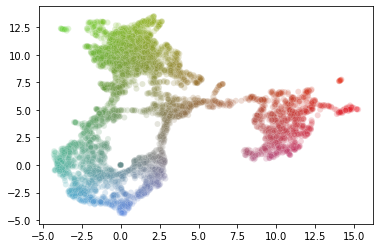

In [514]:
flat = reduced.reshape(reduced.shape[0] * reduced.shape[1], reduced.shape[2])
color = rainbow_wheel(flat)
seaborn.scatterplot(x=flat[:,0], y=flat[:,1], c=color, alpha=0.2)

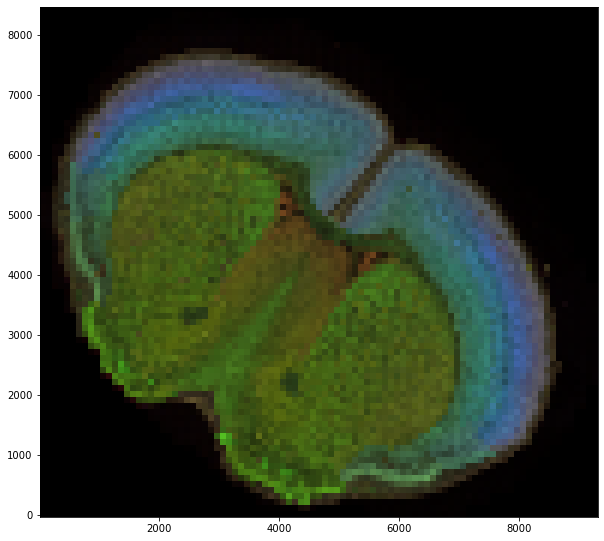

In [515]:
fig, ax = plt.subplots(figsize=(10, 10))

reduce_norm = (reduced - reduced.min()) / (reduced.max() - reduced.min())

rgb = rainbow_wheel(reduced)
norm = bec.sum(axis=2)
norm = norm / norm.max()
rgb *= np.sqrt(norm[:, :, None])

extent = xrange + yrange
ax.imshow(np.rot90(rgb), extent=extent, aspect='equal')

### define a function to put this all together

In [541]:
def reduced_expression_map(data, binsize, umap_args, spacing=None, xlim=None, ylim=None, figsize=(10, 10)):    
    if xlim is not None:
        data = data[(data['x'] >= xlim[0]) & (data['x'] < xlim[1])]
    if ylim is not None:
        data = data[(data['y'] >= ylim[0]) & (data['y'] < ylim[1])]
        
    print("Binning expression counts..")
    bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=binsize, spacing=spacing)

    print("Reducing binned expression counts..")
    umap_args['n_components'] = 2
    reduced = reduce_expression(bec, umap_args=umap_args)
    
    norm = bec.sum(axis=2)
    norm = norm / norm.max()
    color = rainbow_wheel(reduced) * np.sqrt(norm[:, :, None])
    
    fig, ax = plt.subplots(figsize=figsize)
    show_float_rgb(color, extent=xrange + yrange, ax=ax)

    return (bec, genes, xrange, yrange), (reduced,), (fig, ax)

In [542]:
# now plot transcripts in a subregion, using the assigned gene colors
xlim = (5600, 6000)
ylim = (5800, 6200)

mask = (data['x'] > xlim[0]) & (data['x'] < xlim[1]) & (data['y'] > ylim[0]) & (data['y'] < ylim[1])
data2 = data[mask]
data2.shape

(566278,)

Binning expression counts..


  0%|          | 0/80 [00:00<?, ?it/s]

Reducing binned expression counts..


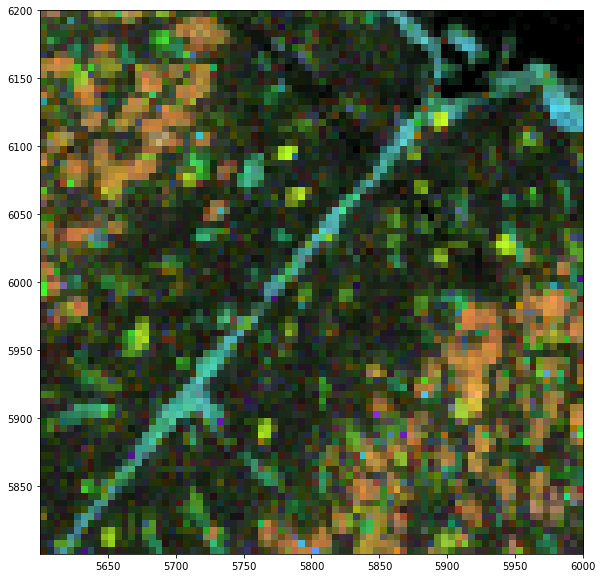

In [543]:
results1 = reduced_expression_map(
    data2, 
    binsize=5, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

**That works pretty well, but can we use this to color transcripts in a scatter plot instead of coloring pixels?**

In [544]:
def gene_center_of_mass(bec, reduced):
    """Given binned expression counts and a umap reduction, 
    find the center of mass position for each gene in umap space.
    """
    expression_sum = bec.sum(axis=0)
    expression_sum[expression_sum==0] = 1  # silence div-by-zero warnings
    expression_norm = bec / expression_sum

    x = (reduced[:, :, 0, None] * expression_norm).sum(axis=0).sum(axis=0)
    y = (reduced[:, :, 1, None] * expression_norm).sum(axis=0).sum(axis=0)
    gene_pts = np.vstack([x, y]).T
    return gene_pts

In [546]:
gene_pts = gene_center_of_mass(bec, reduced)
gene_pts.shape

(501, 2)

In [558]:
# select gene colors from rainbow, but using the original reduced umap space to set the center/range of the pinwheel
gene_colors = rainbow_wheel(gene_pts, center_color=(0.8, 0.8, 0.8))
gene_colors.shape

(501, 3)

<AxesSubplot:>

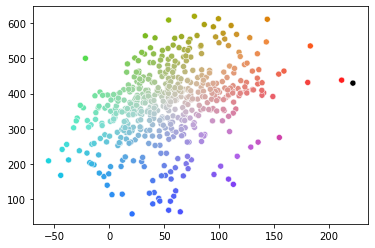

In [559]:
seaborn.scatterplot(x=gene_pts[:,0], y=gene_pts[:,1], c=gene_colors)

<AxesSubplot:>

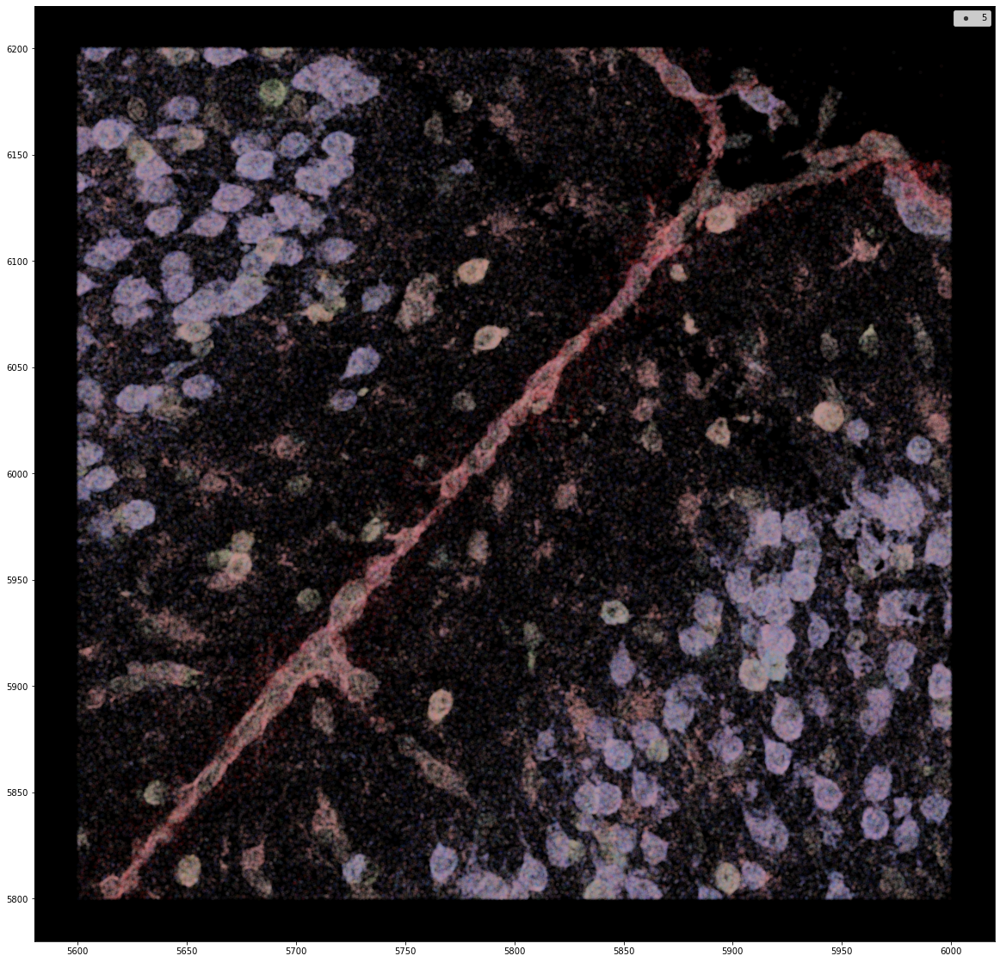

In [560]:
fig,ax = plt.subplots(figsize=(20, 20))
ax.set_facecolor('black')
color = [gene_colors[gene_index[g]] for g in data2['gene']]
seaborn.scatterplot(x=data2['x'], y=data2['y'], c=color, alpha=0.05, linewidth=0, ax=ax, size=5)

In [599]:
def reduced_gene_colors(data, binsize, umap_args, spacing=None):
    print("Binning expression counts..")
    bec, genes, gene_index, xrange, yrange = binned_expression_counts(data['x'], data['y'], data['gene'], binsize=binsize, spacing=spacing)

    print("Reducing binned expression counts..")
    umap_args['n_components'] = 2
    reduced = reduce_expression(bec, umap_args=umap_args)
    
    gene_pts = gene_center_of_mass(bec, reduced)
    gene_colors = rainbow_wheel(gene_pts, center_color=(0.8, 0.8, 0.8))
    color = [gene_colors[gene_index[g]] for g in data['gene']]
    return np.array(color)


def reduced_color_scatterplot(data, binsize, umap_args, spacing=None, xlim=None, ylim=None, figsize=(10, 10), size=2):
    if xlim is not None:
        data = data[(data['x'] >= xlim[0]) & (data['x'] < xlim[1])]
    if ylim is not None:
        data = data[(data['y'] >= ylim[0]) & (data['y'] < ylim[1])]

    color = reduced_gene_colors(data, binsize=binsize, umap_args=umap_args, spacing=spacing)

    fig_area = figsize[0] * figsize[1]
    n_pts = len(data)
    pts_per_pixel = n_pts / (fig_area * 2500)
    if pts_per_pixel >= 2:
        subsample = int(pts_per_pixel)
        print("subsample:", len(data), subsample, pts_per_pixel)
        data = data[::subsample]
        color = color[::subsample]
        n_pts = len(data)
        pts_per_pixel = n_pts / (fig_area * 2500)
    alpha = np.clip(0.03 / pts_per_pixel, 2/254, 1)
    
    fig,ax = plt.subplots(figsize=figsize)
    ax.set_facecolor('black')
    seaborn.scatterplot(x=data['x'], y=data['y'], c=color, alpha=alpha, linewidth=0, ax=ax, size=size, legend=False)    

Binning expression counts..


  0%|          | 0/186 [00:00<?, ?it/s]

Reducing binned expression counts..


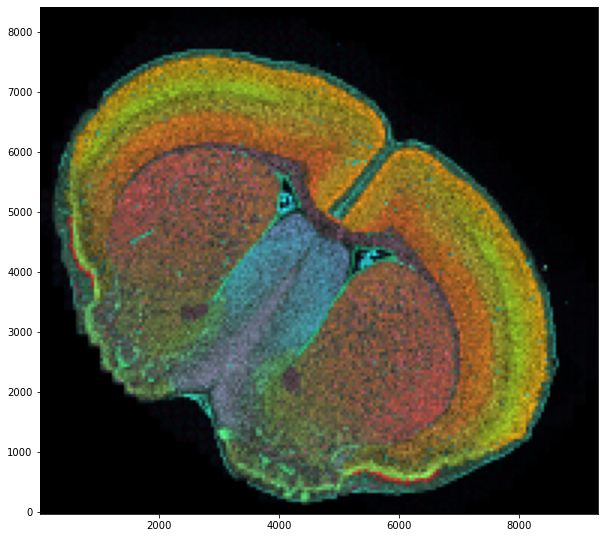

In [383]:
results1 = reduced_expression_map(
    data, 
    binsize=50, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/80 [00:00<?, ?it/s]

Reducing binned expression counts..


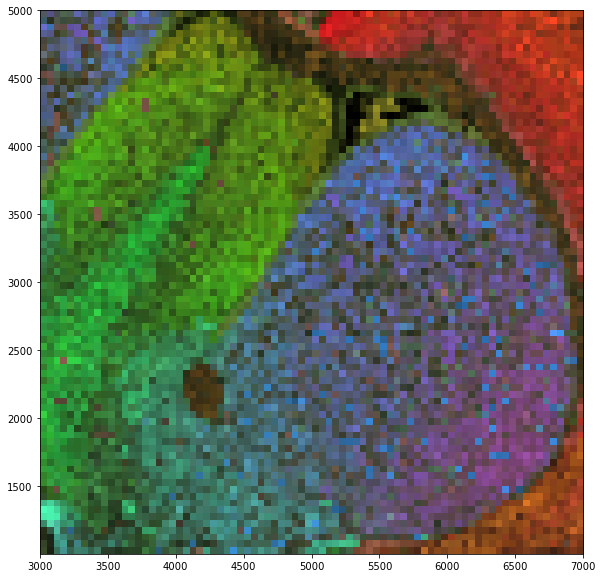

In [368]:
results2 = reduced_expression_map(
    data, 
    binsize=50, 
    xlim=(3000, 7000), 
    ylim=(1000, 5000), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


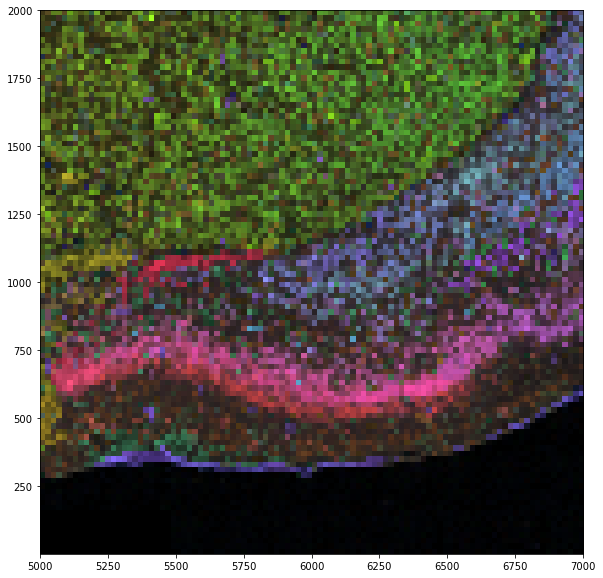

In [395]:
results3 = reduced_expression_map(
    data, 
    binsize=20, 
    xlim=(5000, 7000), 
    ylim=(0, 2000), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=5,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/600 [00:00<?, ?it/s]

Reducing binned expression counts..


/home/luke/miniconda3/envs/jupyter/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


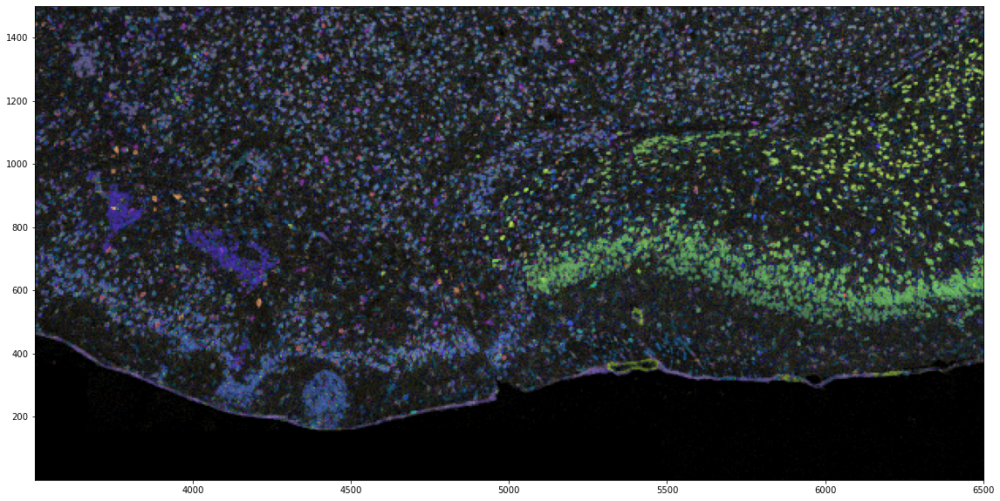

In [400]:
results4 = reduced_expression_map(
    data, 
    binsize=5, 
    xlim=(3500, 6500), 
    ylim=(0, 1500), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=5,
        random_state=0,
    ),
    figsize=(20, 10)
)

Binning expression counts..


  0%|          | 0/160 [00:00<?, ?it/s]

Reducing binned expression counts..


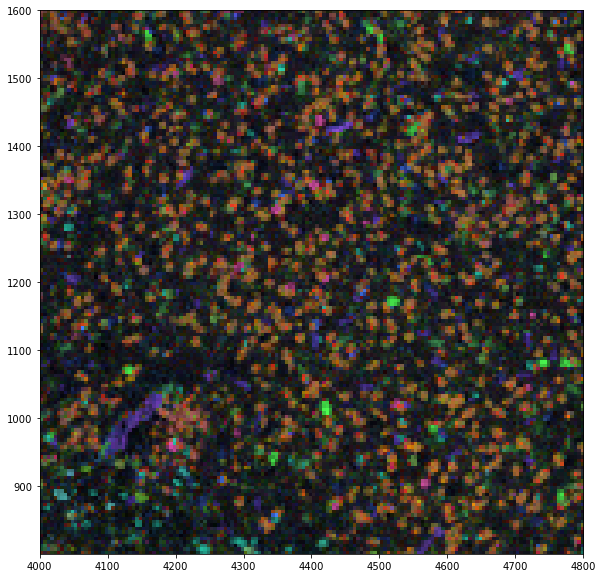

In [403]:
results5 = reduced_expression_map(
    data, 
    binsize=5, 
    xlim=(4000, 4800), 
    ylim=(800, 1600), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=50,
        random_state=0,
        tqdm_kwds={},
    )
)

Binning expression counts..


  0%|          | 0/160 [00:00<?, ?it/s]

Reducing binned expression counts..
subsample: 2380166 9 9.520664


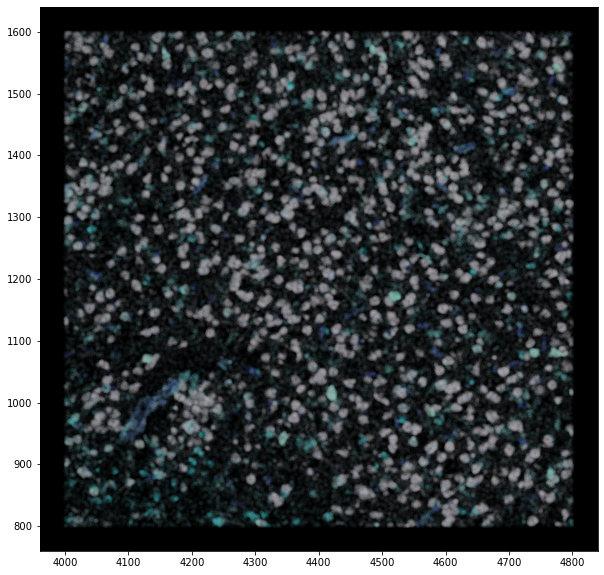

In [600]:
results5 = reduced_color_scatterplot(
    data, 
    binsize=5, 
    xlim=(4000, 4800), 
    ylim=(800, 1600), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=50,
        random_state=0,
        tqdm_kwds={},
    )
)

Binning expression counts..


  0%|          | 0/300 [00:00<?, ?it/s]

Reducing binned expression counts..


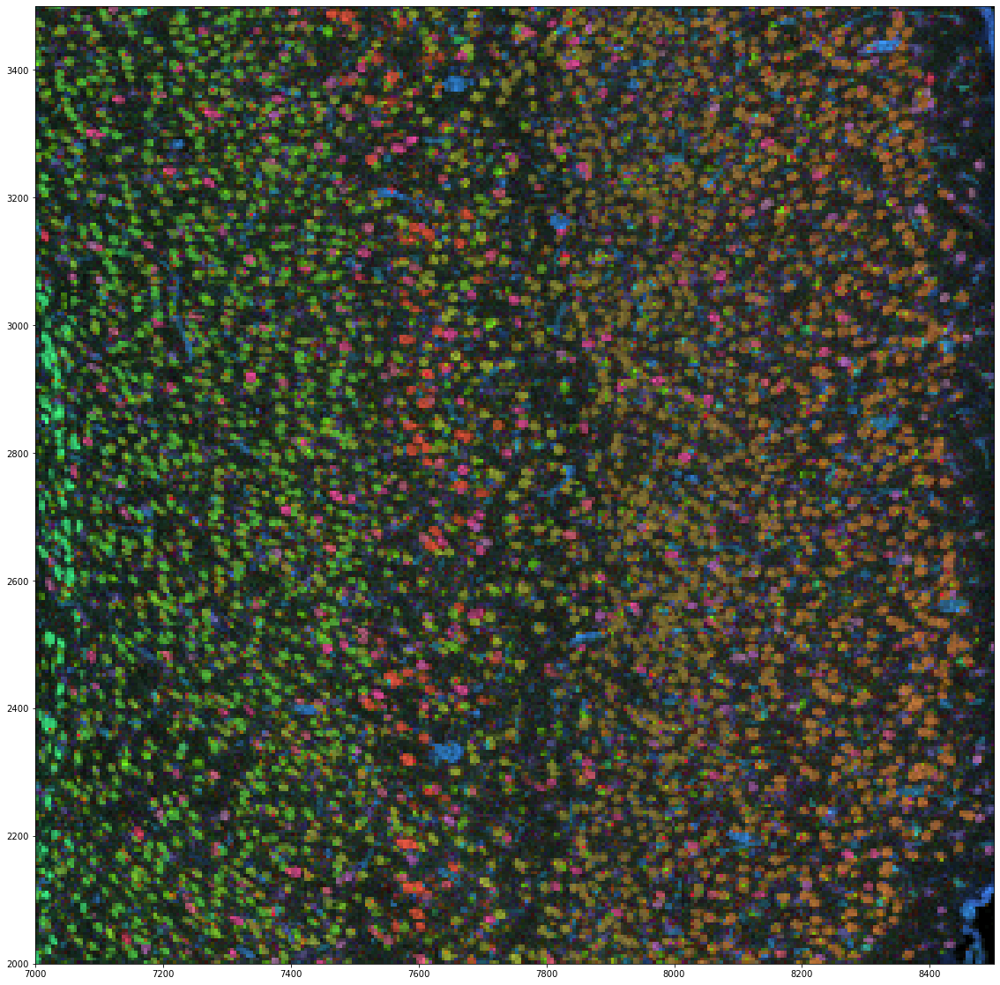

In [402]:
results6 = reduced_expression_map(
    data, 
    binsize=5, 
    xlim=(7000, 8500), 
    ylim=(2000, 3500), 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=50,
        random_state=0,
        tqdm_kwds={},
    ),
    figsize=(20, 20),
)

In [601]:
data_file = '../../../data/merfish_test/202203031129_60988224_VMSC01001/detected_transcripts.csv'
data = load_and_cache(data_file)

Loading from npz..


Binning expression counts..


  0%|          | 0/198 [00:00<?, ?it/s]

Reducing binned expression counts..


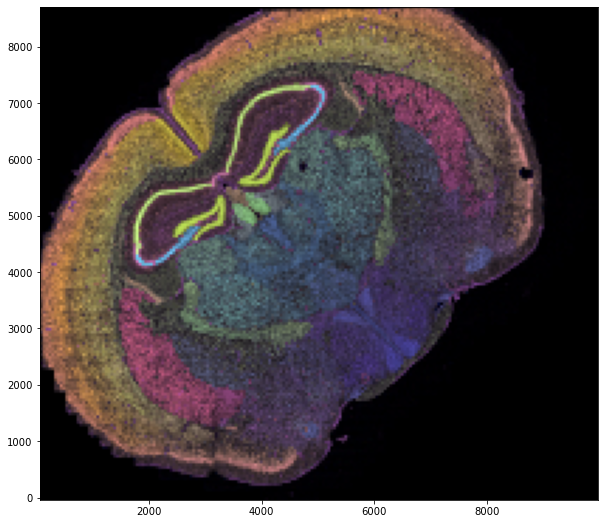

In [406]:
results1 = reduced_expression_map(
    data, 
    binsize=50, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)

Binning expression counts..


  0%|          | 0/125 [00:00<?, ?it/s]

Reducing binned expression counts..


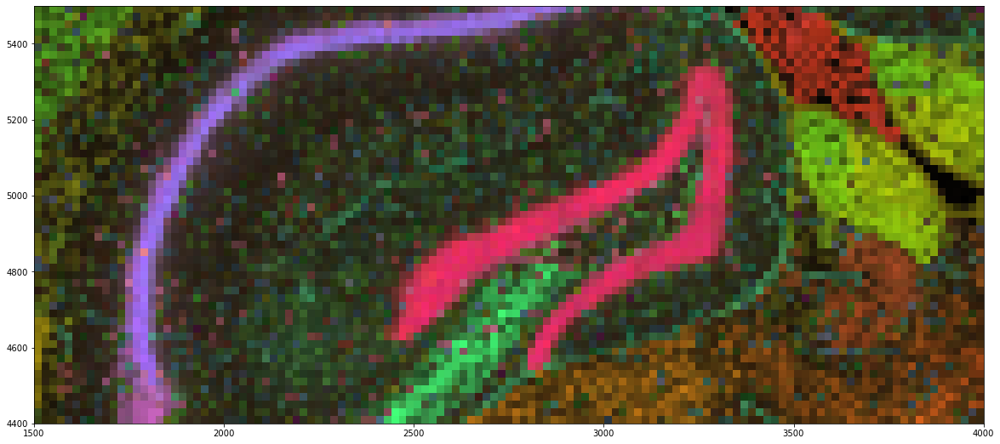

In [420]:
results2 = reduced_expression_map(
    data, 
    binsize=20,
    xlim=(1500, 4000),
    ylim=(4400, 5500),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    ),
    figsize=(20, 10),
)

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


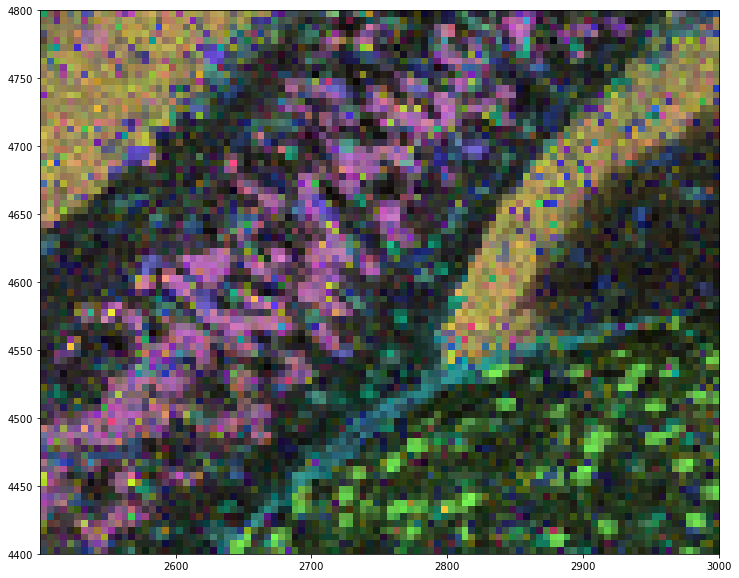

In [440]:
results2 = reduced_expression_map(
    data, 
    binsize=5,
    xlim=(2500, 3000),
    ylim=(4400, 4800),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=25,
        random_state=0,
    ),
    figsize=(20, 10),
)

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..
subsample: 750336 3 3.001344


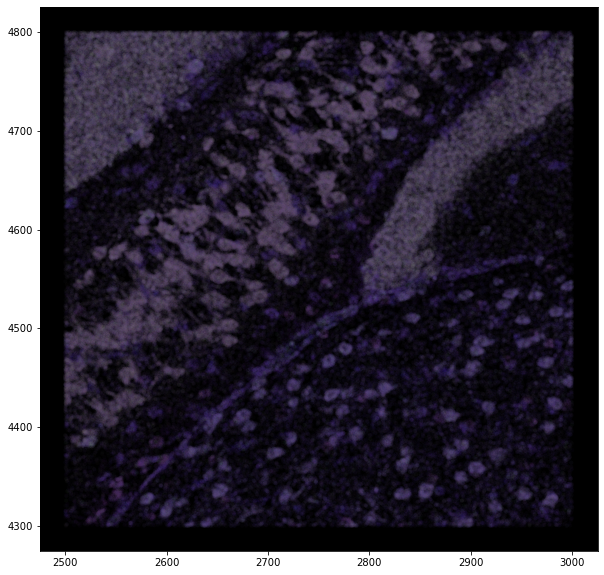

In [603]:
results2 = reduced_color_scatterplot(
    data, 
    binsize=5,
    xlim=(2500, 3000),
    ylim=(4300, 4800),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=25,
        random_state=0,
    ),
    figsize=(10, 10),
)

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


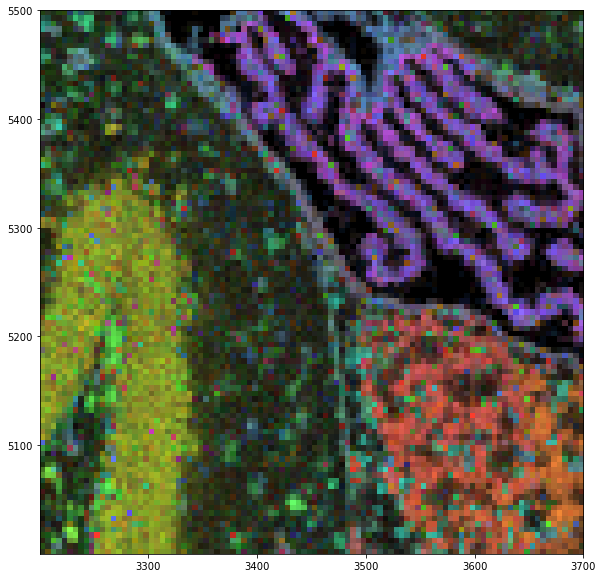

In [439]:
results2 = reduced_expression_map(
    data, 
    binsize=5,
    xlim=(3200, 3700),
    ylim=(5000, 5500),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=25,
        random_state=0,
    ),
    figsize=(20, 10),
)

Binning expression counts..


  0%|          | 0/108 [00:00<?, ?it/s]

Reducing binned expression counts..


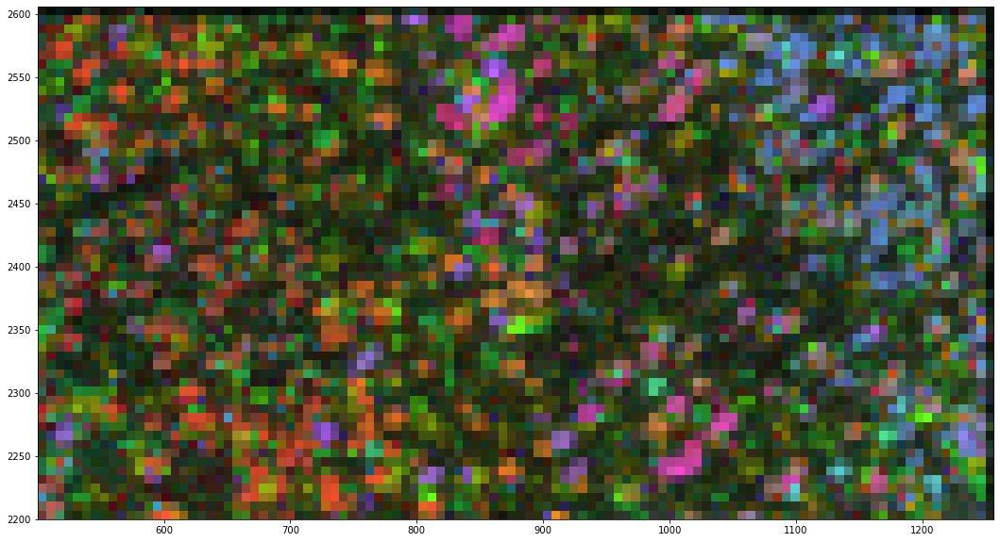

In [438]:
results2 = reduced_expression_map(
    data, 
    binsize=7,
    xlim=(500, 1250),
    ylim=(2200, 2600),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=50,
        random_state=0,
    ),
    figsize=(20, 10),
)

Binning expression counts..


  0%|          | 0/60 [00:00<?, ?it/s]

Reducing binned expression counts..


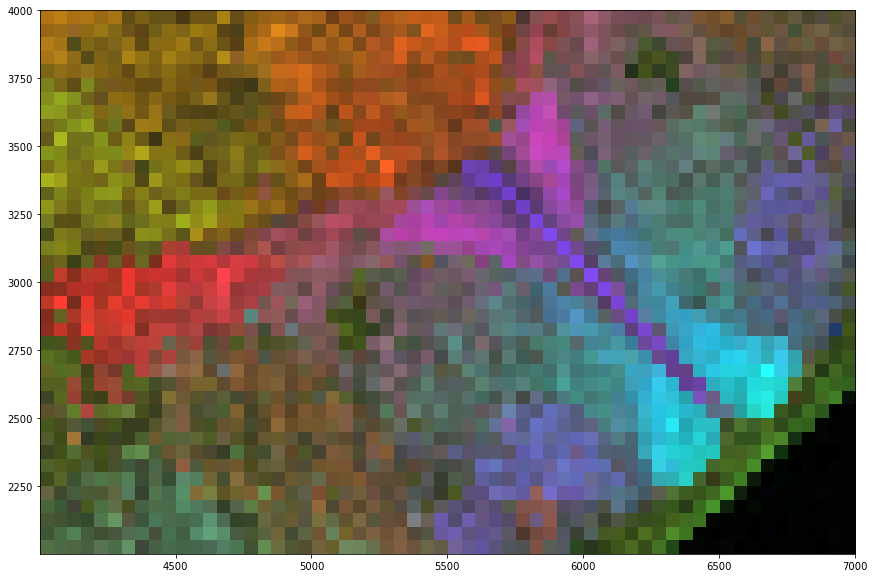

In [418]:
results2 = reduced_expression_map(
    data, 
    binsize=50,
    xlim=(4000, 7000),
    ylim=(2000, 4000),
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    ),
    figsize=(20, 10),
)

In [407]:
data_file = '../../../data/merfish_test/202203160843_60988244_VMSC01601/detected_transcripts.csv'
data = load_and_cache(data_file)

Binning expression counts..


  0%|          | 0/142 [00:00<?, ?it/s]

Reducing binned expression counts..


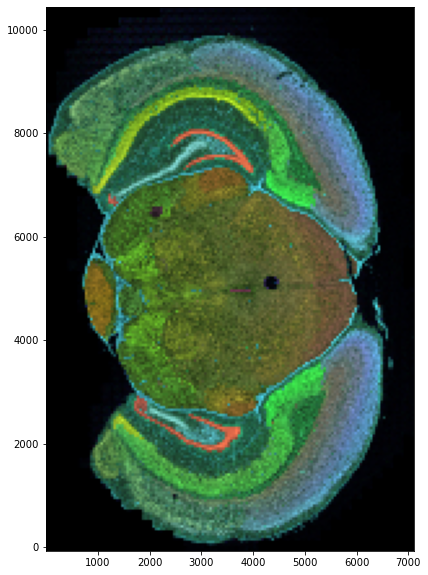

In [409]:
results1 = reduced_expression_map(
    data, 
    binsize=50, 
    umap_args=dict(
        min_dist=0.4,
        n_neighbors=10,
        random_state=0,
    )
)